In [135]:
import os
import warnings
from typing import List
from tqdm import tqdm
from scipy import stats

import numpy as np
import pandas as pd
import seaborn as sns
import xgboost as xgb
import matplotlib.pyplot as plt
from scipy.stats import ks_2samp
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, make_scorer
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.model_selection import cross_val_score

warnings.simplefilter("ignore")
pd.set_option("display.max_columns", 30)

# ф-ии

In [136]:
def corr(data, target):
    correlation = data.corr()
    corr_with_target = correlation[target].sort_values(ascending = False)
    print(corr_with_target)
    fig, axes = plt.subplots(figsize = (14,12))
    plt.title("Correlation of Numeric Features with target", y=1, size=16)
    sns.heatmap(correlation, square=True, vmax=0.8, cmap="viridis")

In [137]:
"""
ф-я определяет нелинейную связь признаков, возвращает список из 20 наиболее важных
"""
def nonlianer_comun(data, numerical, target="class", )-> list:
    parameters = {"max_depth": 6, "n_estimators": 25, "random_state": 27, "n_jobs": 2}
    data = data.copy()
    data = data[numerical]
    for i in data.columns:
        data[i] = data[i].fillna(data[i].median())
    forest = RandomForestClassifier(**parameters)
    forest.fit(data.drop(target, axis=1), data[target])
    
    # numerical original
    top = []
    n_top = 20
    importances = forest.feature_importances_
    idx = np.argsort(importances)[::-1][0:n_top]
    feature_names = data.drop("class", axis=1).columns

    plt.figure(figsize=(20, 5))
    sns.barplot(x=feature_names[idx], y=importances[idx], palette="viridis")
    top.append(feature_names[idx])
    plt.title("What are the top important features to start with?", size=14)
    plt.xticks(rotation=90)
    return top, idx, importances, feature_names

In [138]:
def calculate_feature_separating_ability(
    features: pd.DataFrame, target: pd.Series, fill_value: float = -1) -> pd.DataFrame:
    """
    Оценка разделяющей способности признаков с помощью метрики GINI.

    Parameters
    ----------
    features: pandas.core.frame.DataFrame
        Матрица признаков.

    target: pandas.core.frame.Series
        Вектор целевой переменной.

    fill_value: float, optional, default = -1
        Значение для заполнения пропусков в значении признаков.
        Опциональный параметр, по умолчанию, равен -1;

    Returns
    -------
    scores: pandas.core.frame.DataFrame
        Матрица важности признаков.

    """
    data = features.copy()
    scores = {}
    for feature in data:
        score = roc_auc_score(
            target, data[feature].fillna(fill_value)
        )
        scores[feature] = 2*score - 1

    scores = pd.Series(scores)
    scores = scores.sort_values(ascending=False)

    return scores

# чтение данных

In [139]:
path = "./data"
print(os.listdir(path))

train = pd.read_csv(f"{path}/train.csv")
train.columns = train.columns.str.lower()
test = pd.read_csv(f"{path}/test.csv")
test.columns = test.columns.str.lower()

print("train.shape = {} rows, {} cols".format(*train.shape))
print("test.shape = {} rows, {} cols".format(*test.shape))

['greeks.csv', 'sample_submission.csv', 'test.csv', 'train.csv', 'train_new.csv']
train.shape = 617 rows, 58 cols
test.shape = 5 rows, 57 cols


Обучающая и тестовые выборки сильно разные  

# Исследование данных

In [140]:
categorical = train.dtypes[train.dtypes == "object"].index
numerical = list(set(train.columns) - set(categorical))
print("categorical columns train: len {}, {}".format(len(categorical), categorical))
print("len numerical columns train: {}".format(len(numerical)))
train.head(n=3)

categorical columns train: len 2, Index(['id', 'ej'], dtype='object')
len numerical columns train: 56


,id,ab,af,ah,am,ar,ax,ay,az,bc,bd,bn,bp,bq,br,...,eu,fc,fd,fe,fi,fl,fr,fs,gb,ge,gf,gh,gi,gl,class
0,000ff2bfdfe9,0.209377,3109.03329,85.200147,22.394407,8.138688,0.699861,0.025578,9.812214,5.555634,4126.58731,22.5984,175.638726,152.707705,823.928241,...,3.828384,13.394640,10.265073,9028.291921,3.583450,7.298162,1.73855,0.094822,11.339138,72.611063,2003.810319,22.136229,69.834944,0.120343,1
1,007255e47698,0.145282,978.76416,85.200147,36.968889,8.138688,3.632190,0.025578,13.517790,1.229900,5496.92824,19.4205,155.868030,14.754720,51.216883,...,52.260480,17.175984,0.296850,6785.003474,10.358927,0.173229,0.49706,0.568932,9.292698,72.611063,27981.562750,29.135430,32.131996,21.978000,0
2,013f2bd269f5,0.470030,2635.10654,85.200147,32.360553,8.138688,6.732840,0.025578,12.824570,1.229900,5135.78024,26.4825,128.988531,219.320160,482.141594,...,5.390628,224.207424,8.745201,8338.906181,11.626917,7.709560,0.97556,1.198821,37.077772,88.609437,13676.957810,28.022851,35.192676,0.196941,0


In [141]:
categorical = test.dtypes[test.dtypes == "object"].index
numerical = list(set(test.columns) - set(categorical))
print("categorical columns test: len {}, {}".format(len(categorical), categorical))
print("len numerical columns test: {}".format(len(numerical)))
test.head(n=2)

categorical columns test: len 2, Index(['id', 'ej'], dtype='object')
len numerical columns test: 55


,id,ab,af,ah,am,ar,ax,ay,az,bc,bd,bn,bp,bq,br,...,ep,eu,fc,fd,fe,fi,fl,fr,fs,gb,ge,gf,gh,gi,gl
0,00eed32682bb,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,010ebe33f668,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


__Обучающая выборка содержит:__

* ID (строка, идентификатор записи);
* целевая переменная;
* 56 числовых переменных;
* 2 категориальных 'Id', 'EJ'

__Тестовая выборка содержит:__

* ID_code (строка, идентификатор записи);
* 55 числовых переменных, названных от AB до GL;
* 2 категориальных 'Id', 'EJ'

Проверим данные более детально на факт наличия пропусков и распределения признаков.

In [142]:
def check_missings(df: pd.DataFrame) -> pd.DataFrame:
    """
    Функция для вычисления среднего и общего числа пропусков.

    Parameters
    ----------
    df: pandas.core.DataFrame
        Набор данных для вычисления статистики.

    Returns
    -------
    result: pandas.core.DataFrame
        Датафрейм со статистикой распределения пропусков.

    """
    na = df.isnull().sum()
    result = pd.DataFrame({
        "Total": na,
        "Percent": 100*na/df.shape[0],
        "Types": df.dtypes
    })
    print(f"Total NA-values = {na.sum()}")
    return result.T

In [143]:
check_missings(train)

Total NA-values = 131


,id,ab,af,ah,am,ar,ax,ay,az,bc,bd,bn,bp,bq,br,...,eu,fc,fd,fe,fi,fl,fr,fs,gb,ge,gf,gh,gi,gl,class
Total,0,0,0,0,0,0,0,0,0,0,0,0,0,60,0,...,0,1,0,0,0,1,0,2,0,0,0,0,0,1,0
Percent,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.724473,0.0,...,0.0,0.162075,0.0,0.0,0.0,0.162075,0.0,0.324149,0.0,0.0,0.0,0.0,0.0,0.162075,0.0
Types,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,...,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64


In [144]:
check_missings(test)

Total NA-values = 0


,id,ab,af,ah,am,ar,ax,ay,az,bc,bd,bn,bp,bq,br,...,ep,eu,fc,fd,fe,fi,fl,fr,fs,gb,ge,gf,gh,gi,gl
Total,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Percent,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Types,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,...,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64


Набор данных для обучения имеет 131 пропуск, в тесте пропущенных значений нет. Посмотрим на основные статистики.

In [145]:
def plot_stat_distribution(train: pd.Series, test: pd.Series):
    """
    Визуализация признака для обучающих и тестовых данных;

    Parameters
    ----------
    train: pandas.core.frame.Series
        Значение признака на обучении.

    test: pandas.core.frame.Series
        Значение признака на тесте.

    """
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    train.plot(ax=axes[0], color="#33137d")
    test.plot(ax=axes[1], color="#007539")
    plt.suptitle(f"Feature name - {train.name}")
    axes[0].set_title("Train Distribution")
    axes[1].set_title("Test Distribution")

    fig, axes = plt.subplots(1, 1, figsize=(15, 5))
    plt.axhline(0, color="red", linestyle="--", alpha=0.5)
    (train - test).plot(color="#33137d")
    plt.legend()

def plot_row_distribution(func: callable, train: pd.Series, test: pd.Series, categ: list, axis: int = 1):
    """
    Визуализация распределения статистики по строке обучающих
    и тестовых данных.

    Parameters
    ----------
    func: callable
        Функция для вычисления статистики.

    train: pandas.core.frame.Series
        Значение признака на обучении.

    test: pandas.core.frame.Series
        Значение признака на тесте.

    axis: int, optional, default = 1
        Направление оси вдоль которой выполнять агрегацию данных.
        Значения могут быть: {0 or 'index', 1 or 'columns'}
        Опциональный параметр, по умолчанию, равен 1.

    """
    cat = list(categ)
    cat_test = cat + ["id"]
    cat_test = set(cat_test)
    cat_train = cat + ["id", "class"]
    cat_train = set(cat_train)
    print(cat_test, cat_train)
    plt.figure(figsize=(15, 5))
    
    test = test.drop(cat_test, axis=1).copy()
    train = train.drop(cat_train, axis=1).copy()
    test_stats = test.apply(func, axis=axis)
    train_stats = train.apply(func, axis=axis)

    plt.title("Distribution of mean values per row in the train and test set")
    sns.distplot(test_stats, color="#33137d", kde=True, bins=120, label='train')
    sns.distplot(train_stats, color="#007539", kde=True, bins=120, label='test')
    plt.xlabel(f"feature-{func}", size=13)
    plt.legend()
    plt.show()

In [146]:
train_stats = train.describe()
test_stats = test.describe()

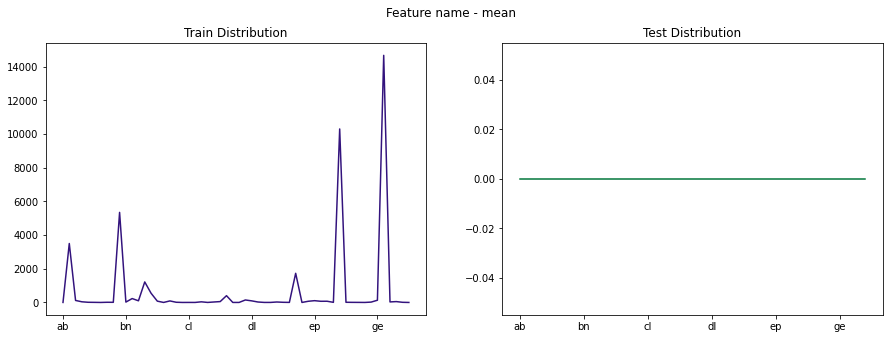

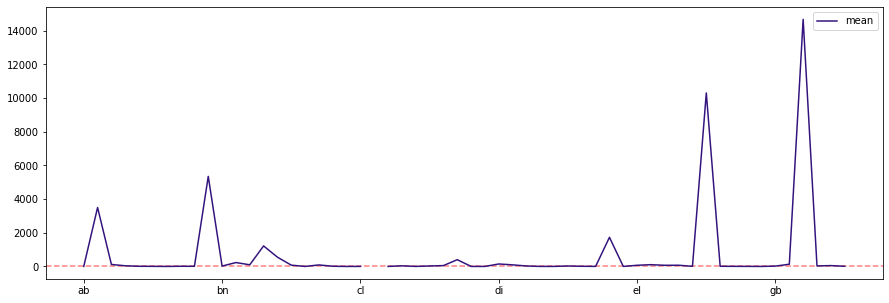

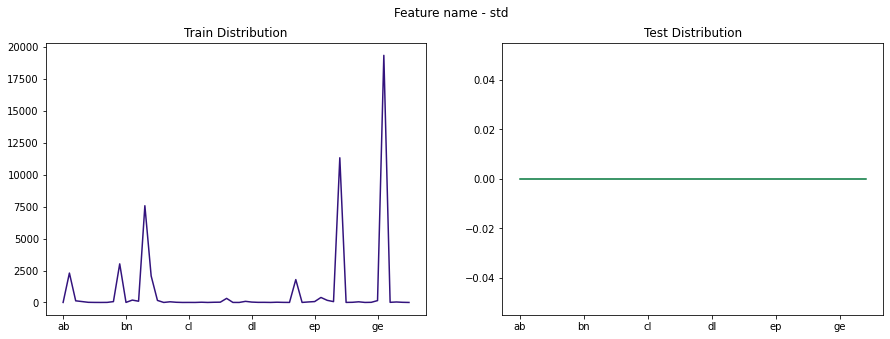

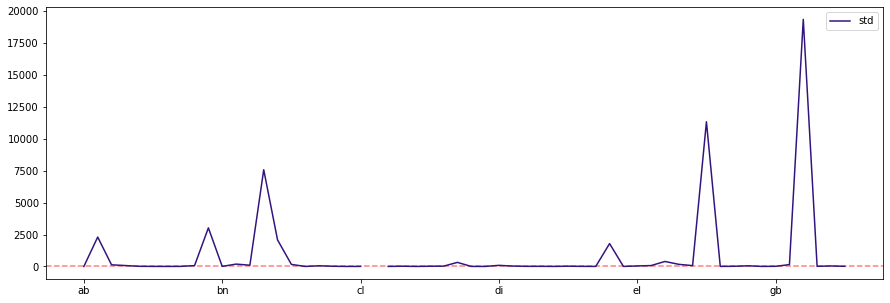

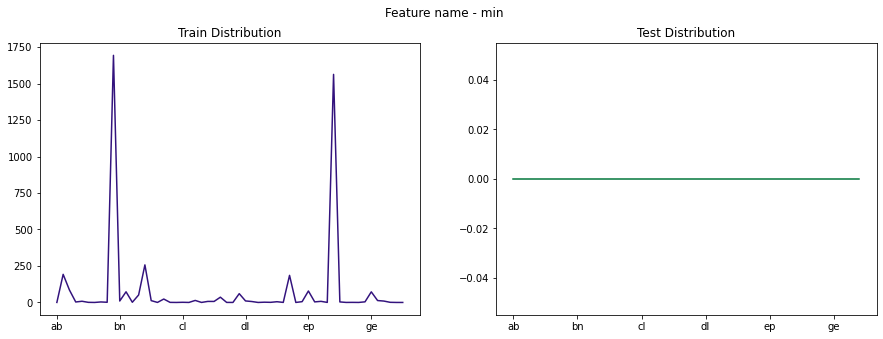

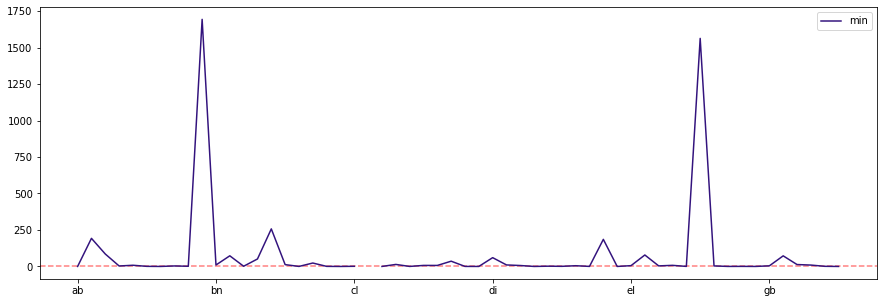

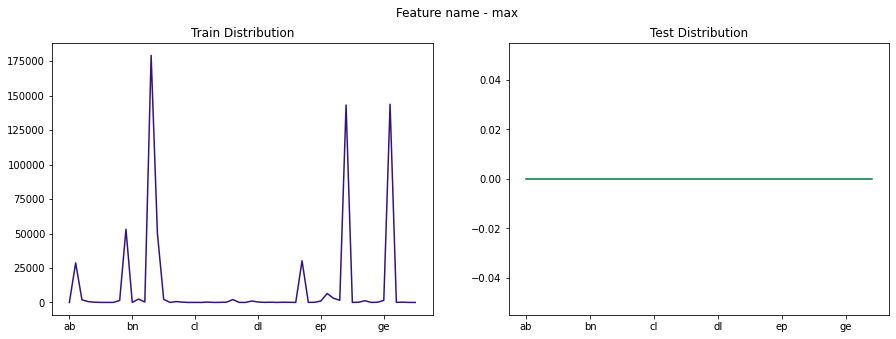

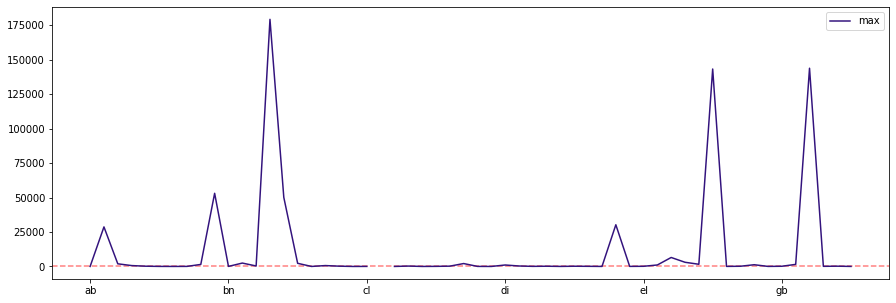

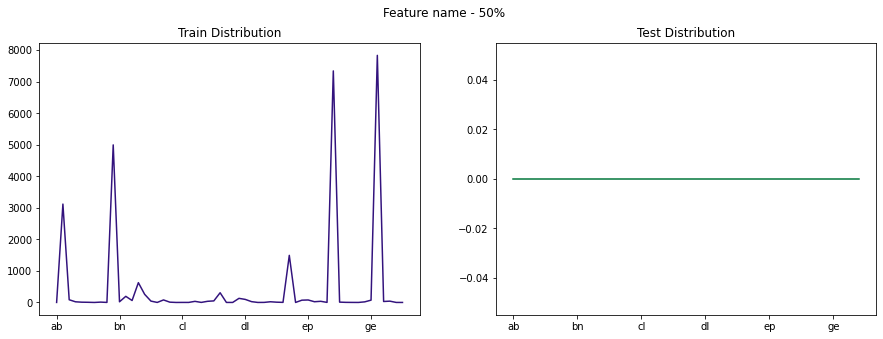

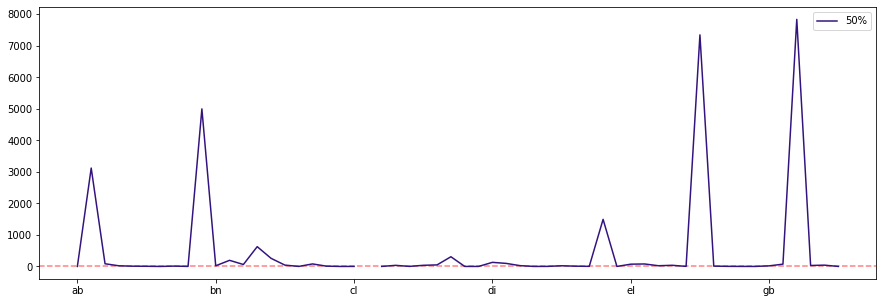

In [147]:
for feature in ["mean", "std", "min", "max", "50%"]:
    plot_stat_distribution(train_stats.loc[feature], test_stats.loc[feature])

In [148]:
train.columns

Index(['id', 'ab', 'af', 'ah', 'am', 'ar', 'ax', 'ay', 'az', 'bc', 'bd ', 'bn',
       'bp', 'bq', 'br', 'bz', 'cb', 'cc', 'cd ', 'cf', 'ch', 'cl', 'cr', 'cs',
       'cu', 'cw ', 'da', 'de', 'df', 'dh', 'di', 'dl', 'dn', 'du', 'dv', 'dy',
       'eb', 'ee', 'eg', 'eh', 'ej', 'el', 'ep', 'eu', 'fc', 'fd ', 'fe', 'fi',
       'fl', 'fr', 'fs', 'gb', 'ge', 'gf', 'gh', 'gi', 'gl', 'class'],
      dtype='object')

In [149]:
round(train["class"].mean(), 4)

0.175

Mean-target: 0.175


Text(0, 0.5, 'Index')

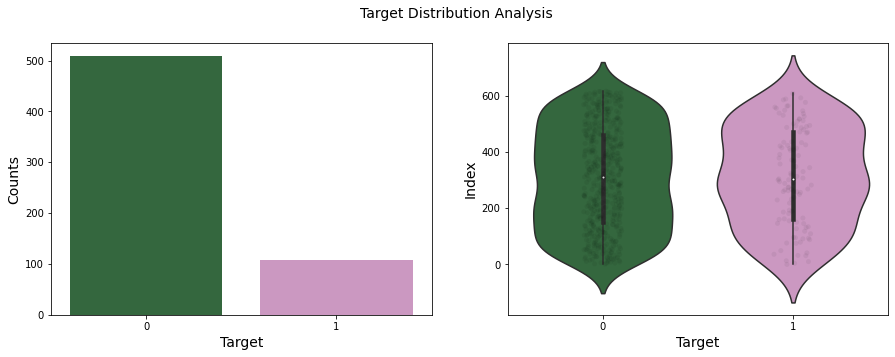

In [150]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
plt.suptitle("Target Distribution Analysis", size=14)
print("Mean-target: {}".format(round(train["class"].mean(), 4)))

sns.countplot(train["class"], ax=axes[0], palette="cubehelix")
sns.violinplot(train["class"], train.index, ax=axes[1], palette="cubehelix")
sns.stripplot(train["class"], train.index, jitter=True, ax=axes[1], color="black", alpha=0.05)

axes[0].set_xlabel("Target", fontsize=14)
axes[0].set_ylabel("Counts", fontsize=14)
axes[1].set_xlabel("Target", fontsize=14)
axes[1].set_ylabel("Index", fontsize=14)

### Краткий вывод:  
* Виден явный дисбаланс целевой переменной, думаюю для медецинских учреждений это вполне норамально, тк люди чаще обращаются с разными проблеммами  
* В правом графике видно, что целевая переменная равномерна распределена по индексам датафрейма, это подтверждает, что данные были сгенерированы процессом

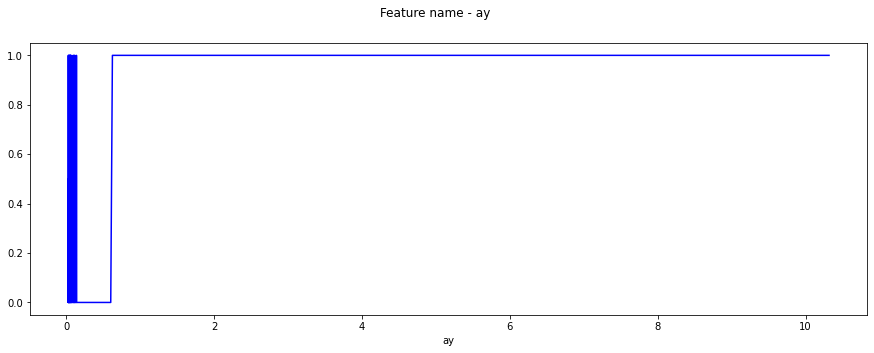

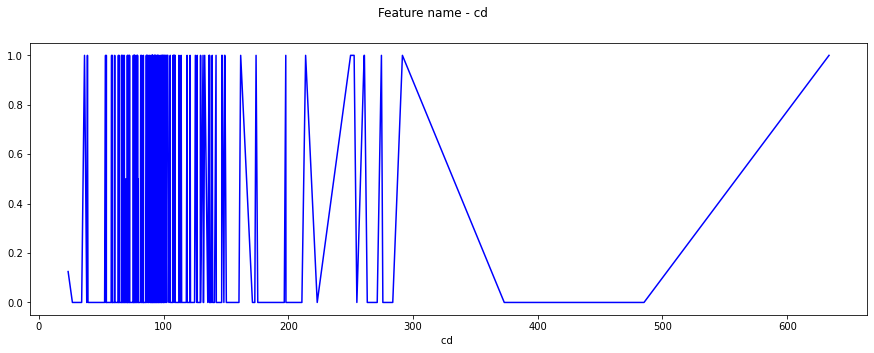

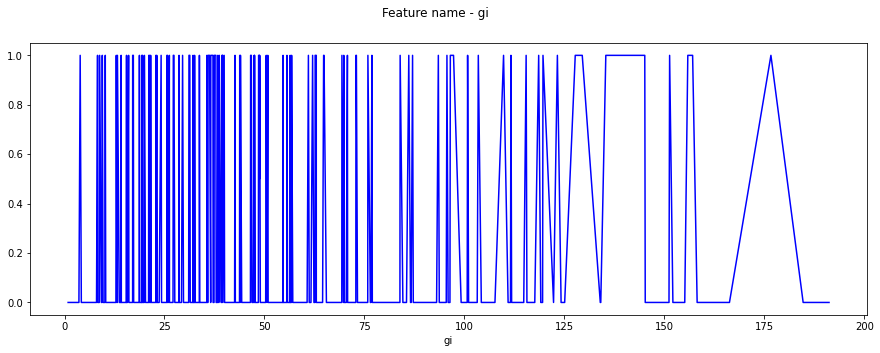

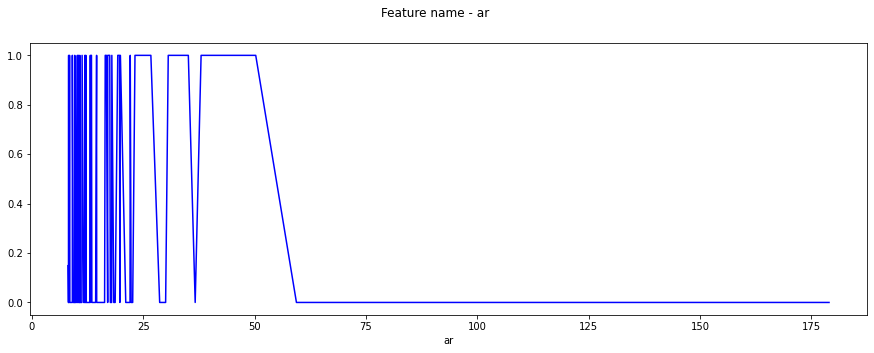

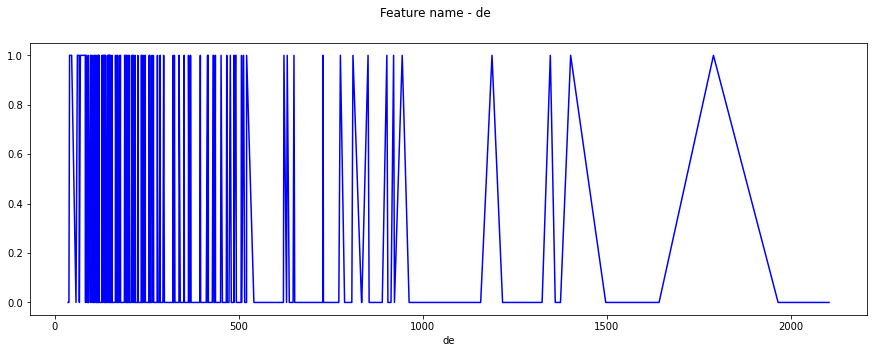

...

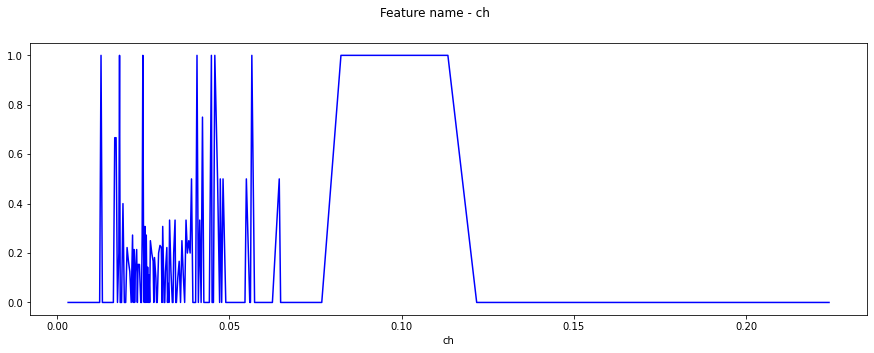

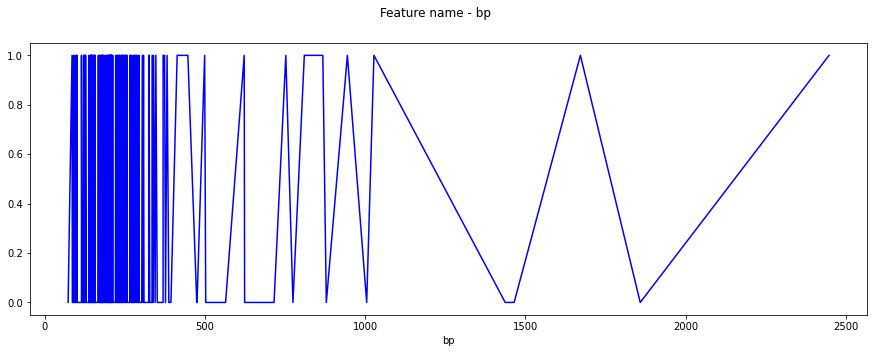

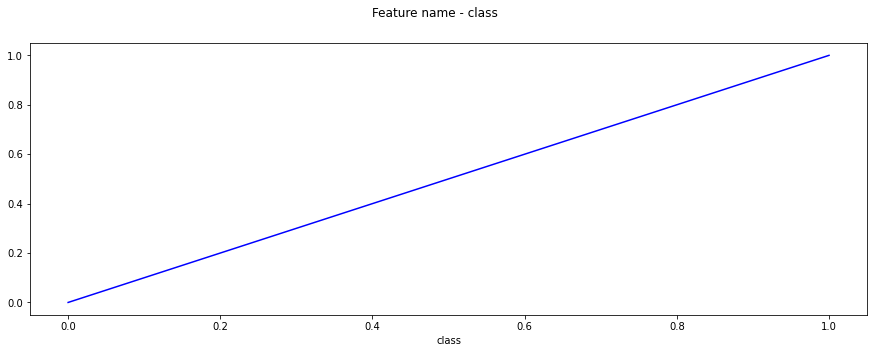

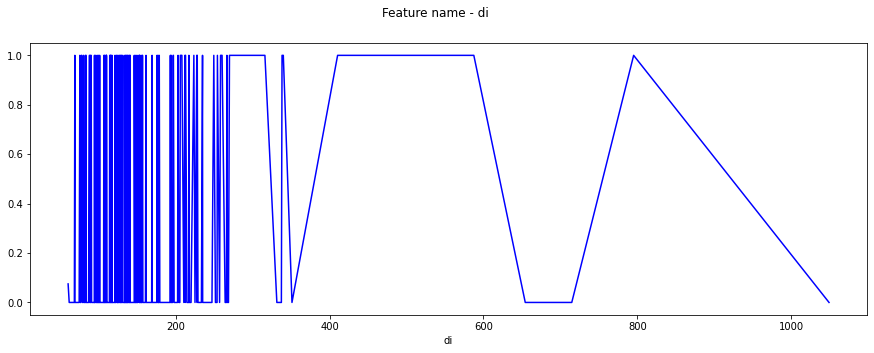

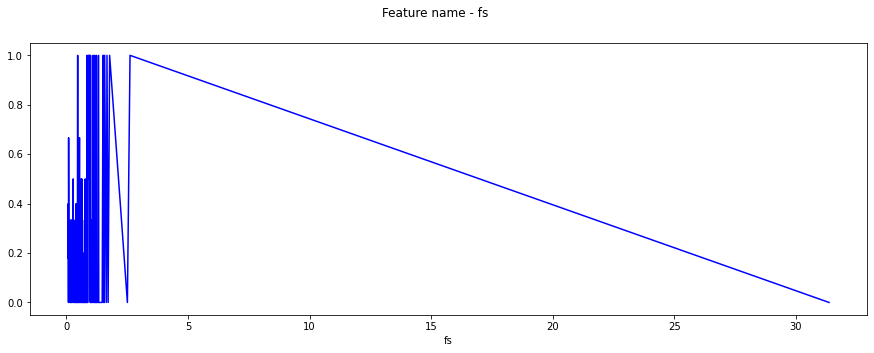

In [151]:
categorical = train.dtypes[train.dtypes == "object"].index
numerical = list(set(train.columns) - set(categorical))
for col in numerical:
    fig = plt.figure(figsize=(15, 5))
    plt.suptitle(f"Feature name - {col}")
    train.groupby([col])["class"].mean().plot(color="blue")

* По графикам можно видеть, что линейной зависимости не у одного признака с целевой переменнной нету

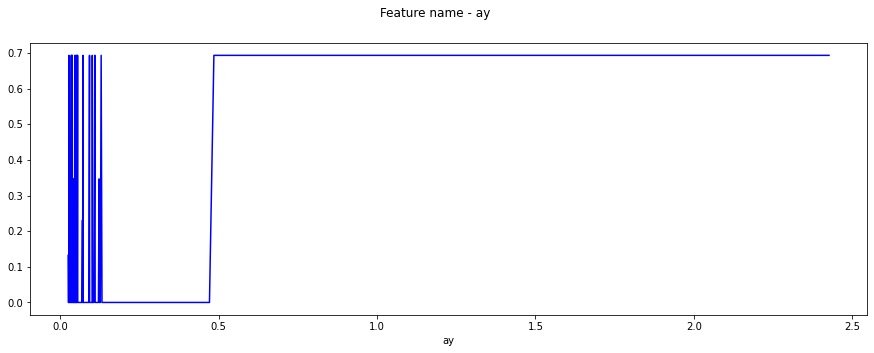

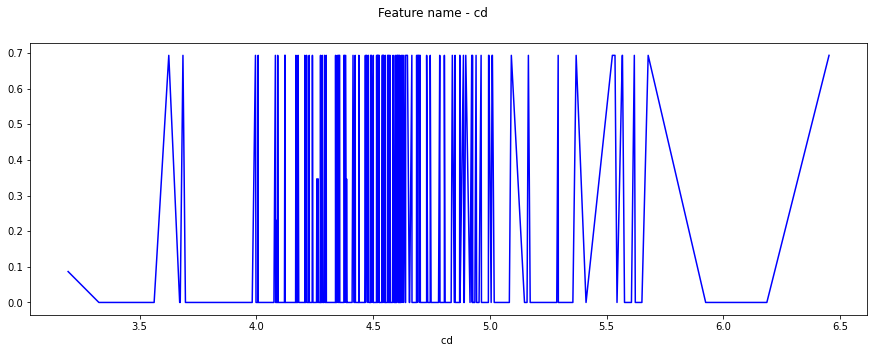

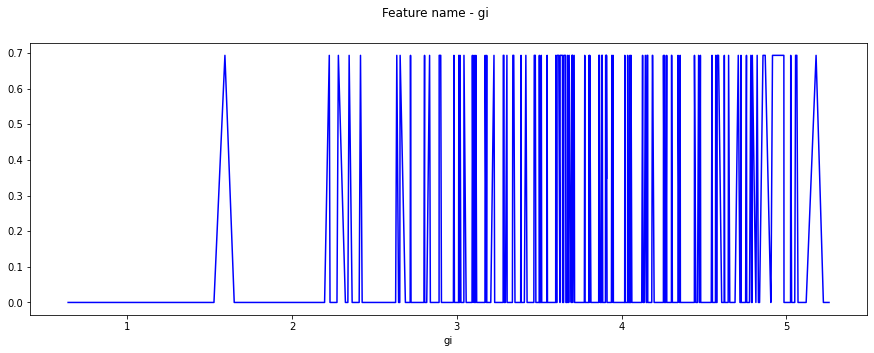

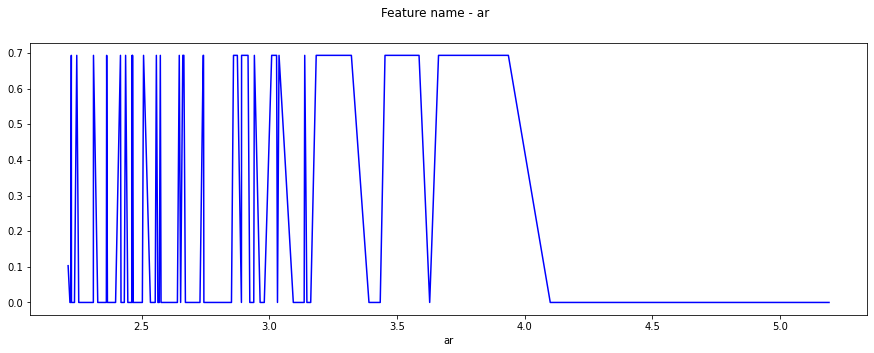

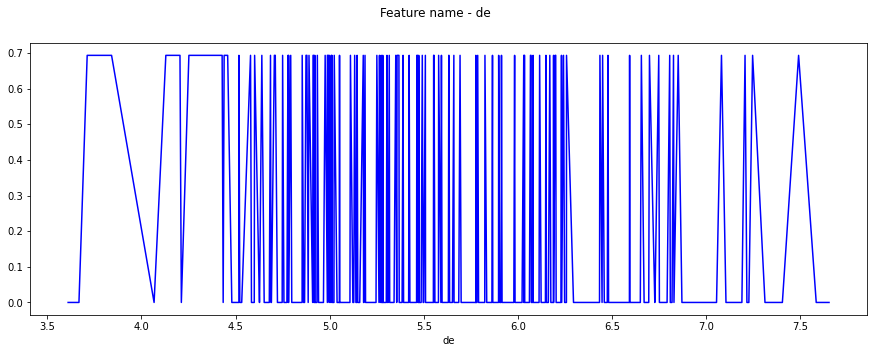

...

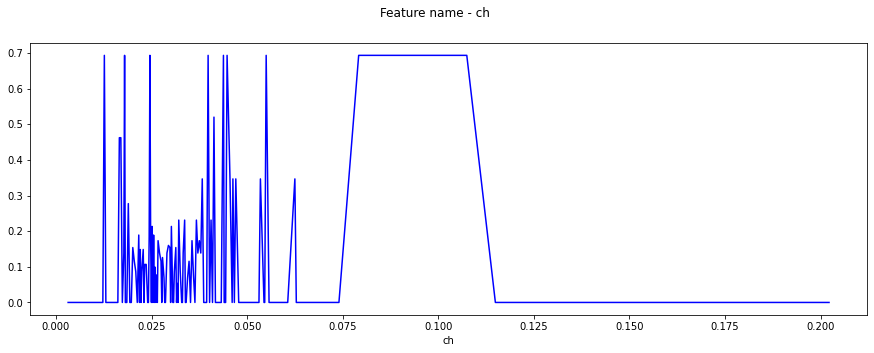

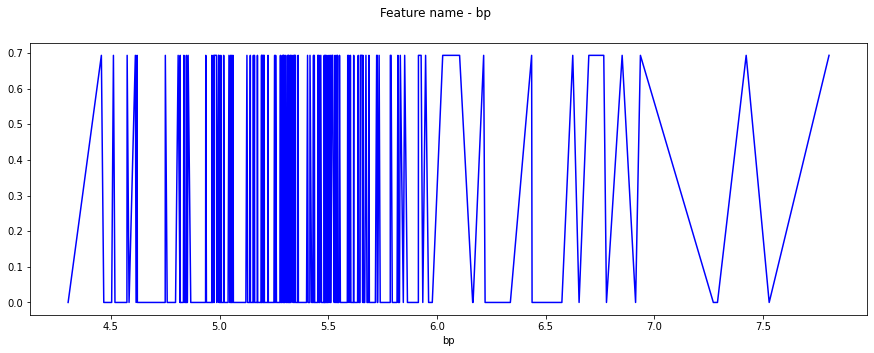

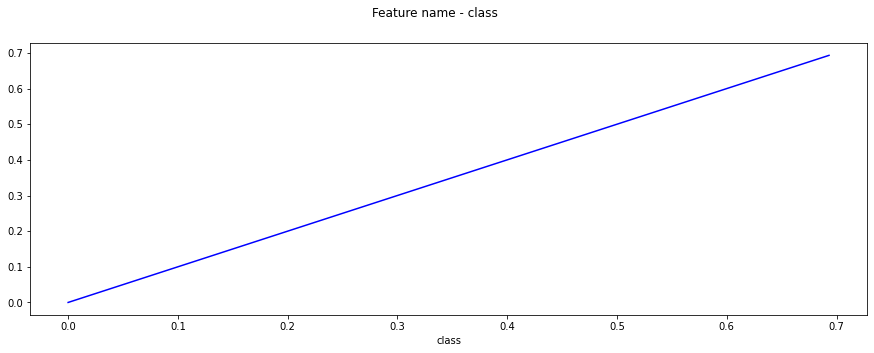

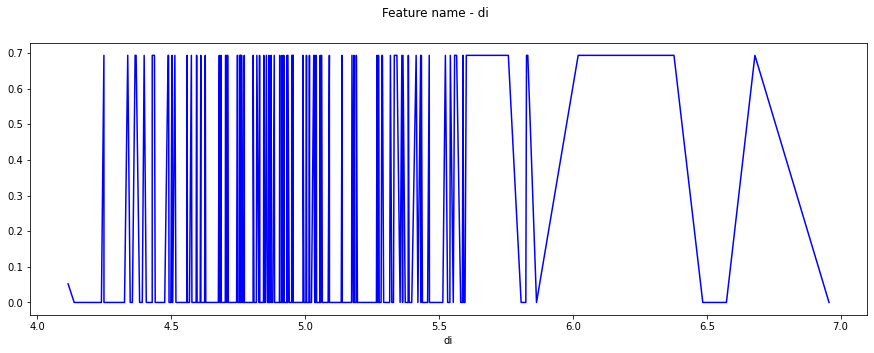

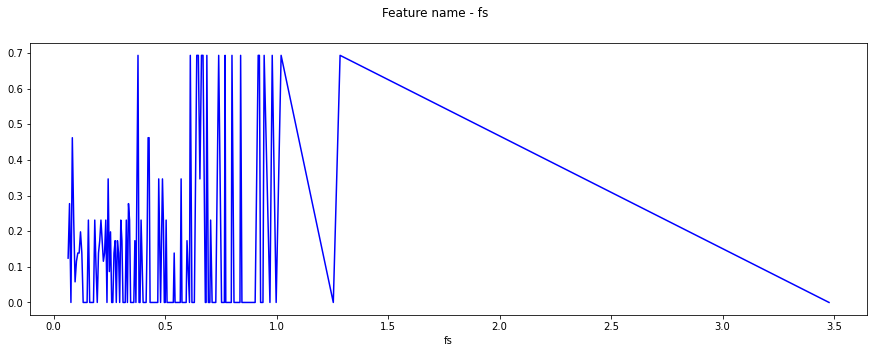

In [152]:
data = train.copy()
data[numerical] = np.log(data[numerical] + 1)
for col in numerical:
    fig = plt.figure(figsize=(15, 5))
    plt.suptitle(f"Feature name - {col}")
    data.groupby([col])["class"].mean().plot(color="blue")

In [153]:
stats.boxcox(data["eb"])[0].shape

(617,)

In [154]:
num = numerical.copy()
num.remove("class")


In [155]:
data = train.copy()
print(num)
for i in data[num].columns:
    print(i)
    data[i] = stats.boxcox(data[i])[0]
data["class"] = train['class']

['ay', 'cd ', 'gi', 'ar', 'de', 'cs', 'ep', 'bq', 'ee', 'am', 'cc', 'dv', 'bc', 'eu', 'eh', 'dl', 'az', 'fc', 'eb', 'fl', 'cr', 'cl', 'df', 'fi', 'cb', 'ax', 'dn', 'bn', 'fr', 'da', 'ah', 'bd ', 'bz', 'gb', 'el', 'eg', 'du', 'dy', 'gf', 'br', 'af', 'cw ', 'fd ', 'ge', 'dh', 'cu', 'gl', 'gh', 'fe', 'cf', 'ab', 'ch', 'bp', 'di', 'fs']
ay
cd 
gi
ar
de
cs
ep
bq
ee
am
cc
dv
bc
eu
eh
dl
az
fc
eb
fl
cr
cl
df
fi
cb
ax
dn
bn
fr
da
ah
bd 
bz
gb
el
eg
du
dy
gf
br
af
cw 
fd 
ge
dh
cu
gl
gh
fe
cf
ab
ch
bp
di
fs


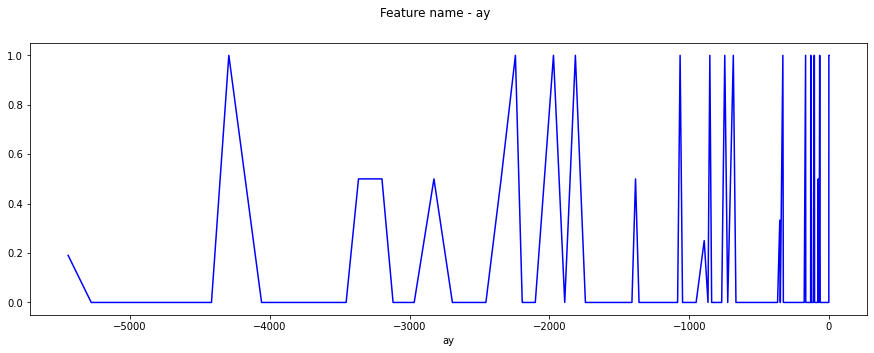

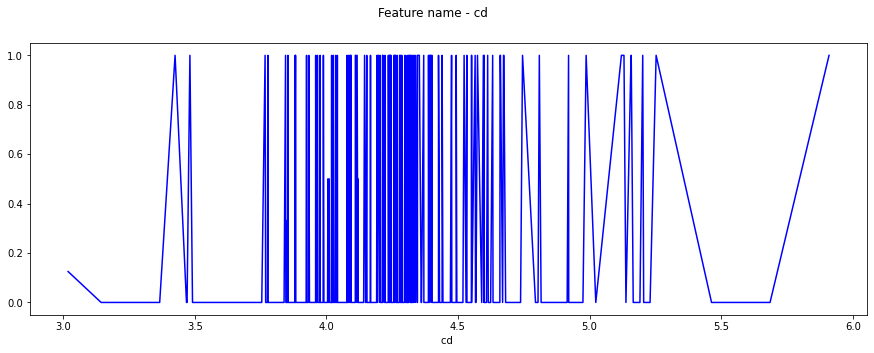

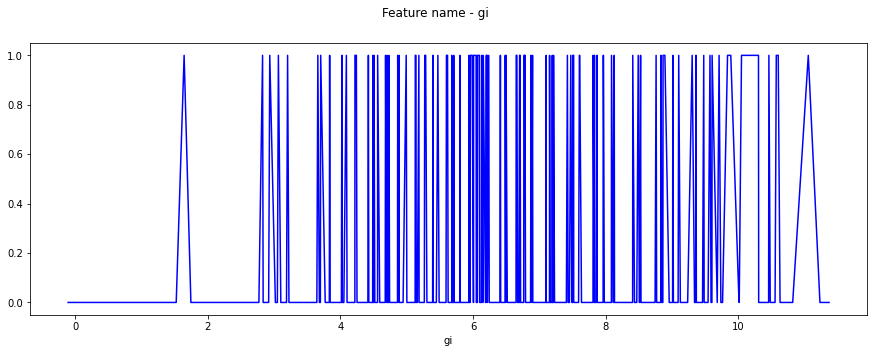

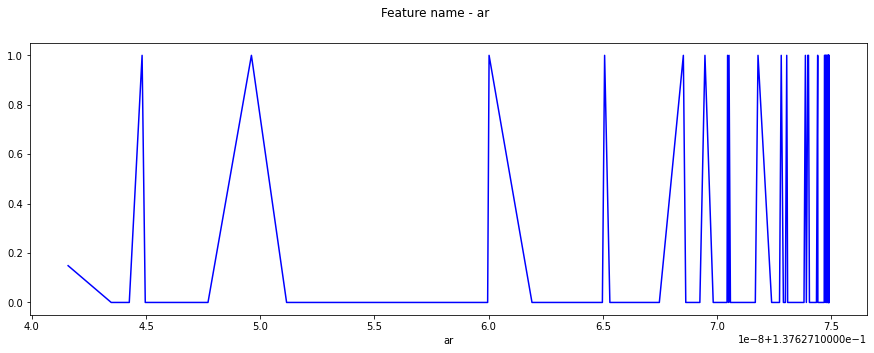

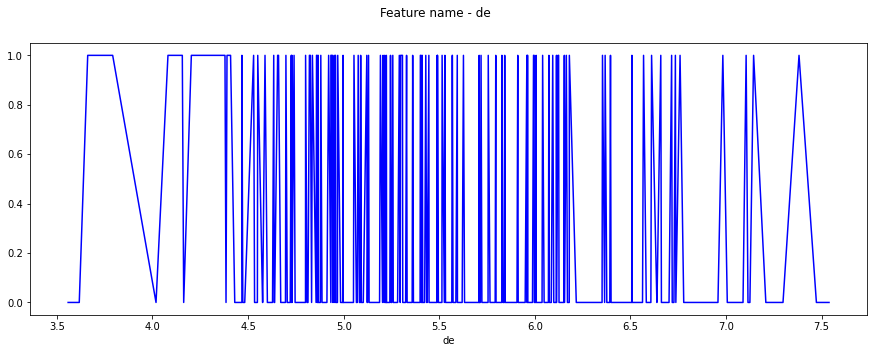

...

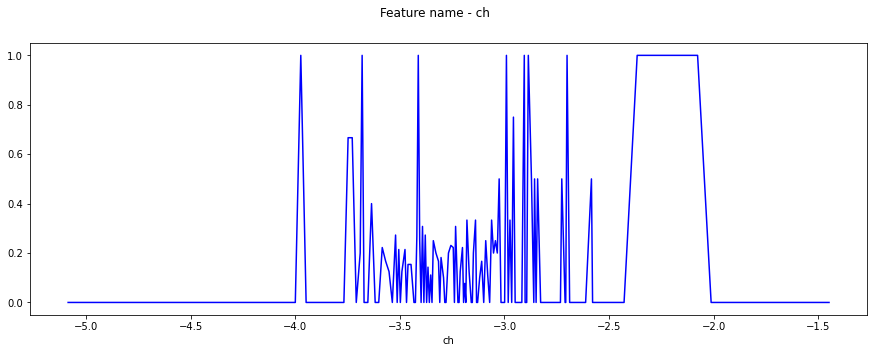

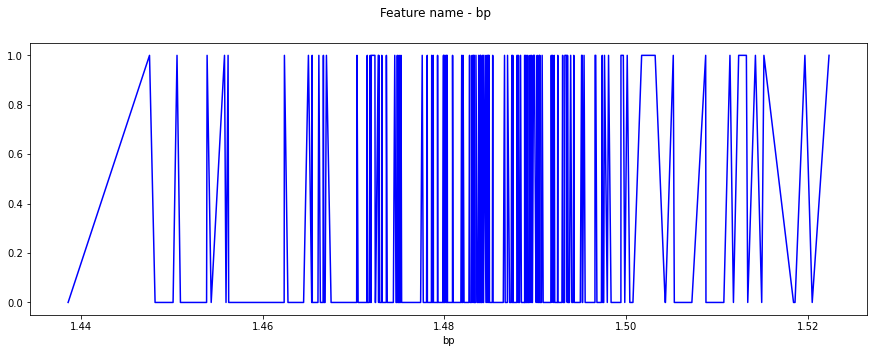

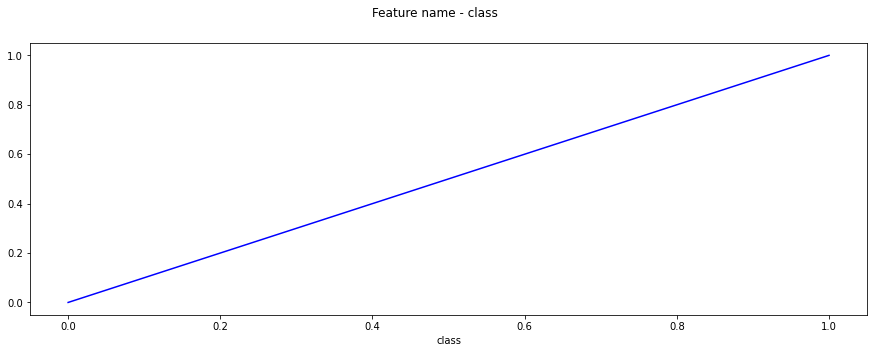

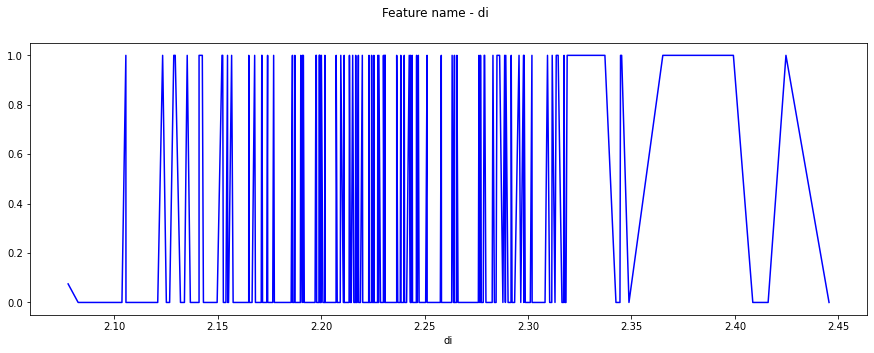

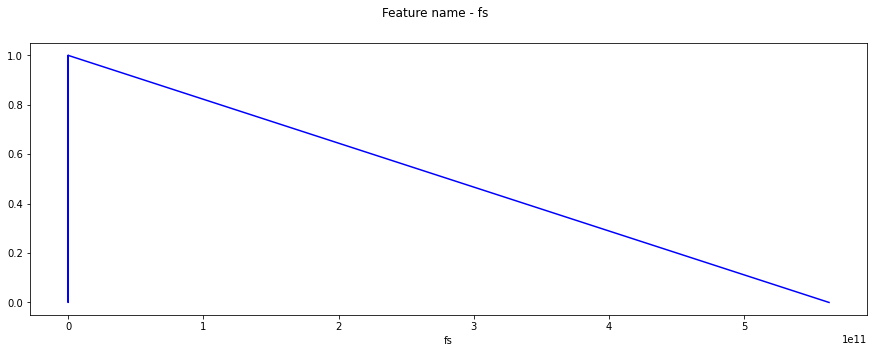

In [156]:
for col in numerical:
    fig = plt.figure(figsize=(15, 5))
    plt.suptitle(f"Feature name - {col}")
    data.groupby([col])["class"].mean().plot(color="blue")

## Анализ распределения признаков

In [157]:
len(numerical)

56

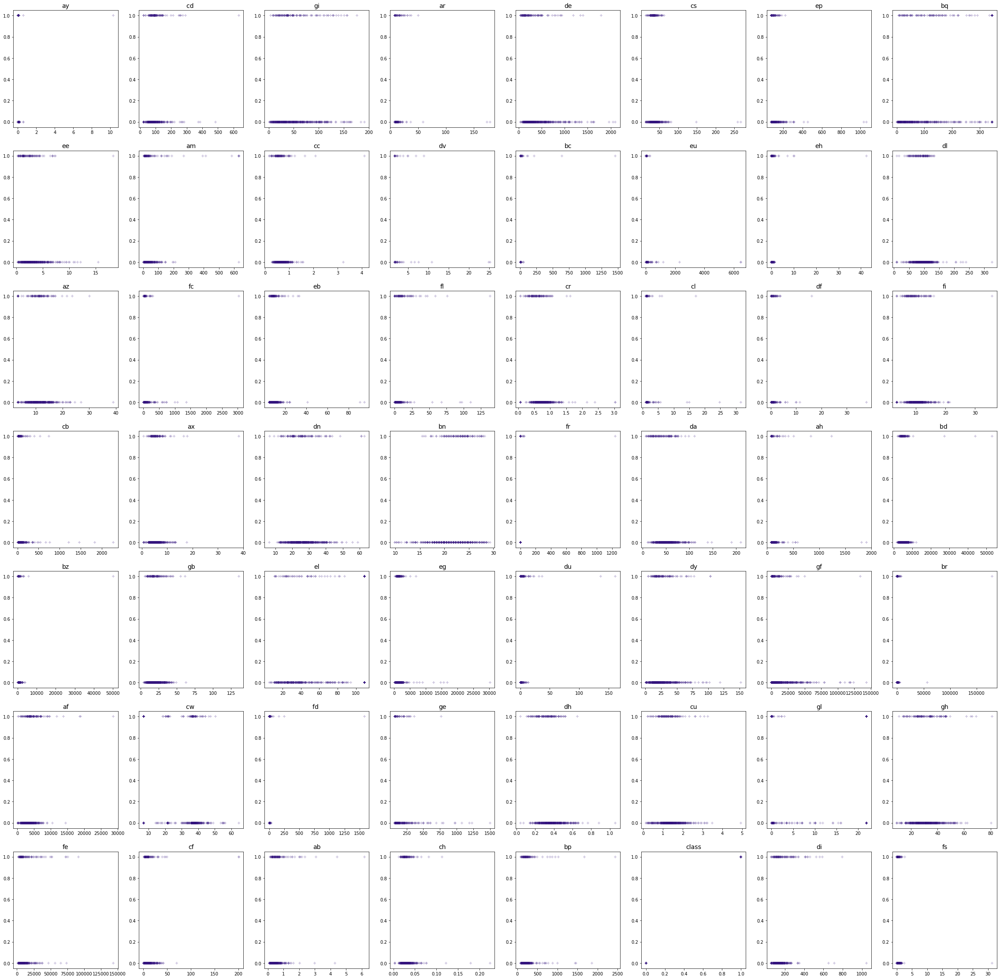

In [158]:
fig, axes = plt.subplots(7, 8, figsize=(40, 40))

for num, feature in enumerate(numerical, start=1):
    plt.subplot(7, 8, num)
    plt.title(f"{feature}", size=14)
    plt.scatter(
        train[feature],
        train["class"],
        color="#33137d",
        alpha=0.25,
        marker="+")

* по графикам видно, что некоторые признаки относительно целевой переменной имеют одинаковое распределение, такие как: gi, dl, dh, fs, dy, cu, ay, br на них нужно повнимательнне посмотреть  
* есть признаки у которых основные значенния находятся в определенном промежутке, и видны большие выбросы

In [159]:
for i in numerical:
    min_ = train[i].min()
    max_ = train[i].max()
    mean_ = train[i].mean()
    quantile = train[i].quantile(0.99)
    quantile_2 = quantile * 2
    quantile_min = train[i].quantile(0.01)
    count_nan = int(train[i].isna().sum())
    print(i)
    print("max: ", max_)
    print("mean: ", mean_)
    print("quantile 99: ", quantile)
    print("quantile 1: ", quantile_min)
    if max_ > quantile_2:
        print("предположительно выбросов: ",train.loc[train[i] > quantile_2].shape[0])
        list_quantile = list(train[i].loc[train[i] > quantile_2])
        q = [train['class'].loc[train[i] == quant].array[0] for quant in list_quantile]
        print("class list: ",q)
        print("values: ",list_quantile)
    if min_ < quantile_min:
        print("значений меньше 1 перцентиля: ",train.loc[train[i] > quantile_min].shape[0])
    
#     print(type(count_nan))
    if count_nan  > 0:
        print("строк в данных: {}, пропусков в столбце {}".format(train.shape[0], train[i].isna().sum()))
    print(50 * "*")

ay
max:  10.315851
mean:  0.06031962398703402
quantile 99:  0.21440454000000067
quantile 1:  0.025578
предположительно выбросов:  4
class list:  [1, 0, 1, 0]
values:  [10.315851, 0.6019965, 0.6245295, 0.595602]
**************************************************
cd 
max:  633.534408
mean:  90.2517352350081
quantile 99:  275.57696288
quantile 1:  23.3876
предположительно выбросов:  1
class list:  [1]
values:  [633.534408]
**************************************************
gi
max:  191.194764
mean:  50.584436914100486
quantile 99:  161.7777712000001
quantile 1:  4.2379358400000005
значений меньше 1 перцентиля:  610
**************************************************
ar
max:  178.943634
mean:  10.12824205186386
quantile 99:  34.46723880000013
quantile 1:  8.138688
предположительно выбросов:  2
class list:  [0, 0]
values:  [178.943634, 173.534448]
**************************************************
de
max:  2103.40519
mean:  401.90129933144243
quantile 99:  1612.4150326000008
quantile 1:  58.

значений меньше 1 перцентиля:  610
**************************************************
cf
max:  200.967526
mean:  11.241063893030795
quantile 99:  42.04596076000002
quantile 1:  0.510888
предположительно выбросов:  2
class list:  [1, 1]
values:  [200.967526, 200.967526]
**************************************************
ab
max:  6.161666
mean:  0.477149358184765
quantile 99:  2.164872720000003
quantile 1:  0.119644
предположительно выбросов:  2
class list:  [1, 1]
values:  [6.161666, 4.435374]
значений меньше 1 перцентиля:  608
**************************************************
ch
max:  0.224074
mean:  0.030614714748784445
quantile 99:  0.07525384000000016
quantile 1:  0.01326136
предположительно выбросов:  2
class list:  [0, 0]
values:  [0.1791, 0.224074]
значений меньше 1 перцентиля:  610
**************************************************
bp
max:  2447.81055
mean:  231.32222312965965
quantile 99:  995.1778216800019
quantile 1:  89.46697752
предположительно выбросов:  1
class list:  [1

* в данных есть значения выше перцентиля 99, можно предположить, что это выбросы, их не много в дальнейшем можно попробывать удалить и посмотреть как это скажется на модели
* значений ниже 1 перцентиля достаточно много
* пропусков в каждом столбце не много, можно будет заменить на медиану

Еще раз посмотрим на линейную зависимость признаков, но уже на карте признаков

class    1.000000
af       0.302638
bq       0.281257
ab       0.280612
du       0.261000
di       0.260760
fl       0.244185
am       0.239170
fe       0.216359
bn       0.198283
eh       0.179855
cd       0.171304
bp       0.157286
bc       0.155882
fd       0.131100
bz       0.112423
bd       0.112184
cf       0.109748
fr       0.104099
ax       0.097616
br       0.088554
eb       0.088005
gb       0.083343
ay       0.082420
gi       0.076894
el       0.067947
ar       0.064380
df       0.064272
dy       0.062734
ah       0.044645
gh       0.033540
fc       0.030689
cl       0.016852
dv       0.015477
az       0.013516
ch       0.008144
fs       0.001139
dn      -0.008478
cb      -0.014777
eg      -0.024610
eu      -0.039739
cs      -0.047438
cc      -0.054723
cw      -0.062639
ep      -0.068383
ge      -0.070766
cu      -0.083185
fi      -0.094327
gl      -0.119202
de      -0.124977
gf      -0.128208
ee      -0.135324
dl      -0.147716
da      -0.204612
dh      -0.206839
cr      -0

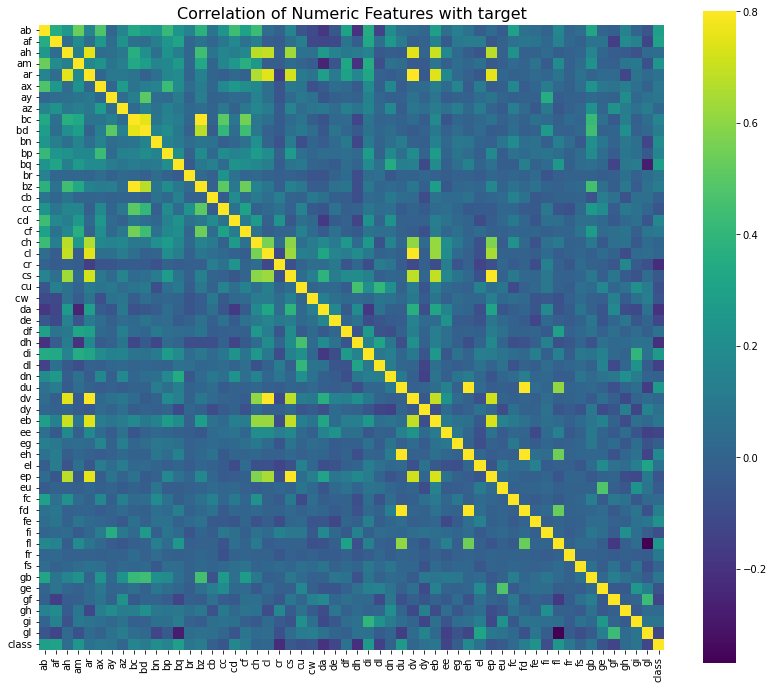

In [160]:
corr(train, "class")

* на карте можно увидеть, что есть  некоторые признаки со слабой линейной зависимостью, в 30%
* так же есть признаки коррелирующие между собой: bc и bd, ch cl, dv eb, от них в дальнейшем тоже можно будет избавиться

так же можно посмотреть на нелинейную связь признаков

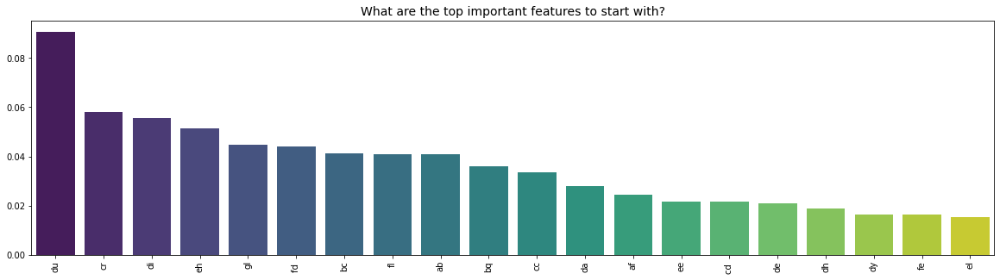

In [161]:
top_features, idx, importances, feature_names = nonlianer_comun(train, numerical)

In [162]:
top_features

[Index(['du', 'cr', 'di', 'eh', 'gl', 'fd ', 'bc', 'fl', 'ab', 'bq', 'cc', 'da',
        'af', 'ee', 'cd ', 'de', 'dh', 'dy', 'fe', 'el'],
       dtype='object')]

* 20 числовых признаков нелинейно зависимых

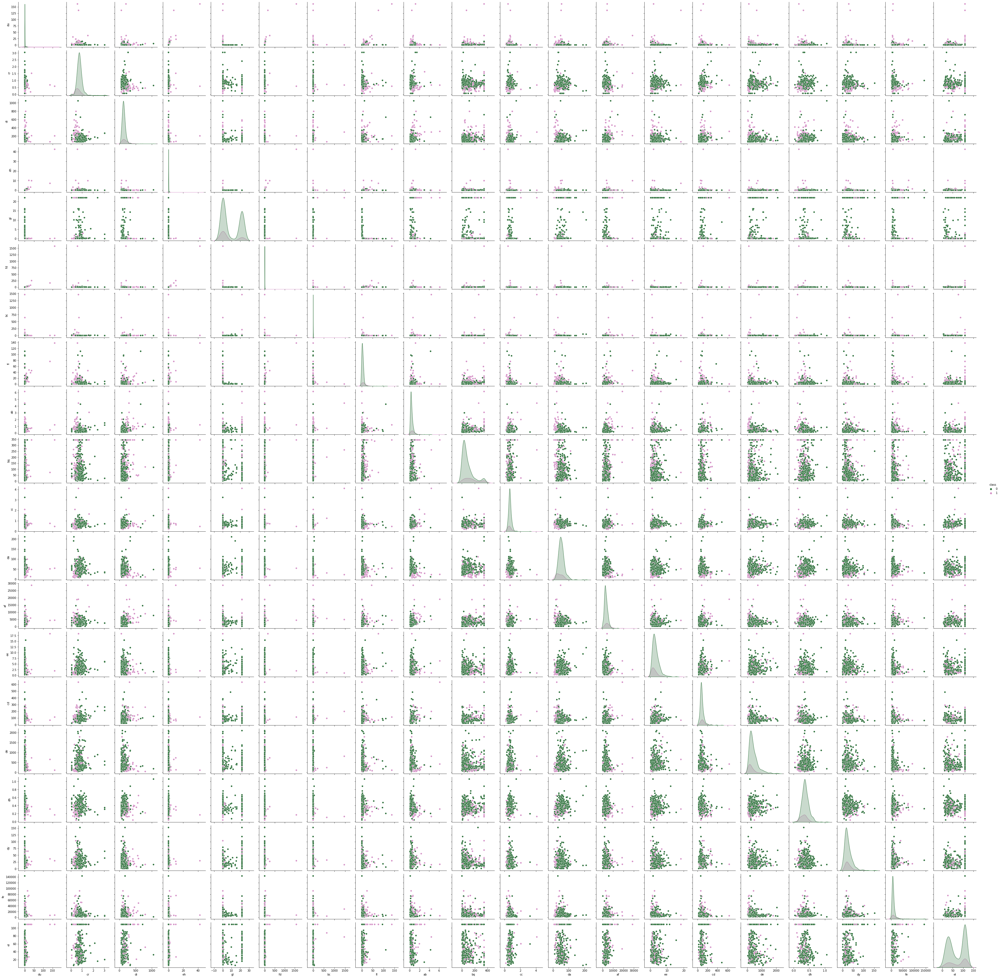

In [163]:
top_features = train[feature_names[idx]]
top_features = top_features.join(train['class'])
sns.pairplot(top_features, hue="class", palette="cubehelix")

* На многих графиках видно, что значения целевой переменной не пересекаются, считаю это хорошим знаком тк можно предположить, что эти значения в данном признаке находятся далеко друк от друга и имеют какую-то разделяющую способность, в данных признаках думаю модель будет легче находить закономерности
* gl при отношении к себе имеет два пика, можно предположить, что данный признак говорит о болезни если имеет значения в двух диапозонах, стоит попробывать обучить в дальнейшем модель без него

# категориальные признаки

In [164]:
categorical

Index(['id', 'ej'], dtype='object')

In [165]:
print(train["ej"].value_counts())
print("пропусков: {}".format(train["ej"].isna().sum()))


B    395
A    222
Name: ej, dtype: int64
пропусков: 0


категориальные признаки заменю на частоту вхождения

In [166]:
freq_encoder = train["ej"].value_counts(normalize=True)
train["ej_freq"] = train["ej"].map(freq_encoder)
train[["ej", "ej_freq"]].head(2)

,ej,ej_freq
0,B,0.640194
1,A,0.359806


In [167]:
train = train.drop(["ej", "id"], axis=1)

In [168]:
train.to_csv("data/train_new.csv", index=False)

In [169]:
os.listdir("data")

['greeks.csv',
 'sample_submission.csv',
 'test.csv',
 'train.csv',
 'train_new.csv']

In [170]:
numerical.remove("class")
numerical.append("ej_freq")

## посмотрим на разделяющую способность признаков

In [171]:
scores = calculate_feature_separating_ability(
    train[numerical], train["class"]
)
scores

bq         0.465837
ab         0.435567
du         0.412355
af         0.394273
fl         0.386033
bn         0.323510
bc         0.305847
cd         0.302208
di         0.294059
eb         0.262643
eh         0.259659
fe         0.246671
df         0.243997
fd         0.231172
am         0.226588
bp         0.222368
fr         0.181310
ar         0.165357
el         0.133486
ej_freq    0.121880
dy         0.118006
gi         0.102143
bz         0.099814
cl         0.095485
ax         0.094212
eu         0.085644
dv         0.059994
gb         0.047151
az         0.033053
fs         0.018409
gh         0.006840
ch         0.005221
eg         0.002292
fc        -0.005385
cf        -0.012588
br        -0.014680
bd        -0.022994
ah        -0.039347
cb        -0.041166
cs        -0.061340
dn        -0.066579
ay        -0.082296
ep        -0.082424
cw        -0.100615
ge        -0.107109
cu        -0.168431
dl        -0.217711
fi        -0.242869
gf        -0.251910
cc        -0.263825
